# Imports

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Load Data

Had to load it in parts as having it as 1 file was too big for GitHub.

In [5]:
df_1 = pd.read_csv('CSV_Datasets/2_Oracle_Exported_Dataset/1_Superstore_Datamart_2015.csv')
df_2 = pd.read_csv('CSV_Datasets/2_Oracle_Exported_Dataset/2_Superstore_Datamart_2015.csv')
df_3 = pd.read_csv('CSV_Datasets/2_Oracle_Exported_Dataset/3_Superstore_Datamart_2015.csv')

# Concatenate the Dataset Parts Together

In [6]:
# Did it this way to be able to easily reset the dataframe if needed.
full_df = pd.concat([df_1,df_2,df_3])
df = full_df

# Handy Functions

In [7]:
def display_all(df):     # For any Dataframe df
   with pd.option_context('display.max_rows',10000): # Change number of rows accordingly
      with pd.option_context('display.max_columns',100): # Change number of columns accordingly
          display(df)

In [8]:
def Output_full_display(aggregate_data):
    formatted_values = aggregate_data.apply(lambda x: "{:,.2f}".format(x))
    return formatted_values

# Checking the data

In [9]:
df.head().transpose()

,0,1,2,3,4
RETAIL_ID,1,2,3,4,5
ORDER_ID,1,2,3,4,5
ORDER_KEYS,1,2,3,4,5
ORDER_DATE,01/01/2010,01/01/2010,01/01/2010,01/01/2010,01/01/2010
SHIP_MODE,Standard Class,Second Class,First Class,First Class,First Class
SHIP_DATE,08/01/2010,04/01/2010,02/01/2010,02/01/2010,02/01/2010
CUSTOMER_ID,9310,108,8690,2278,9006
FIRST_NAME,Freddie,Brian,William,Grant,Bryson
LAST_NAME,Elliott,DeCherney,Owen,Spencer,Jackson
FULL_NAME,Freddie Elliott,Brian DeCherney,William Owen,Grant Spencer,Bryson Jackson


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 983892 entries, 0 to 327890
Data columns (total 32 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   RETAIL_ID                            983892 non-null  int64  
 1   ORDER_ID                             983892 non-null  int64  
 2   ORDER_KEYS                           983892 non-null  int64  
 3   ORDER_DATE                           983892 non-null  object 
 4   SHIP_MODE                            983892 non-null  object 
 5   SHIP_DATE                            983892 non-null  object 
 6   CUSTOMER_ID                          983892 non-null  int64  
 7   FIRST_NAME                           983892 non-null  object 
 8   LAST_NAME                            983892 non-null  object 
 9   FULL_NAME                            983892 non-null  object 
 10  POSTAL_ID                            983892 non-null  int64  
 11  POSTAL_CODE       

In [11]:
df.shape

(983892, 32)

## Change Data Types [If Any]

In [12]:
df['POSTAL_CODE'] = df['POSTAL_CODE'].astype(str)

In [13]:
df['ORDER_DATE'] = pd.to_datetime(df['ORDER_DATE'], format="%d/%m/%Y")

In [14]:
df['SHIP_DATE'] = pd.to_datetime(df['SHIP_DATE'], format="%d/%m/%Y")

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 983892 entries, 0 to 327890
Data columns (total 32 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   RETAIL_ID                            983892 non-null  int64         
 1   ORDER_ID                             983892 non-null  int64         
 2   ORDER_KEYS                           983892 non-null  int64         
 3   ORDER_DATE                           983892 non-null  datetime64[ns]
 4   SHIP_MODE                            983892 non-null  object        
 5   SHIP_DATE                            983892 non-null  datetime64[ns]
 6   CUSTOMER_ID                          983892 non-null  int64         
 7   FIRST_NAME                           983892 non-null  object        
 8   LAST_NAME                            983892 non-null  object        
 9   FULL_NAME                            983892 non-null  object        
 10  P

In [16]:
df.head()

,RETAIL_ID,ORDER_ID,ORDER_KEYS,ORDER_DATE,SHIP_MODE,SHIP_DATE,CUSTOMER_ID,FIRST_NAME,LAST_NAME,FULL_NAME,...,PRODUCT_COST_PRICE,PRODUCT_DISCOUNT_PERCENTAGE,PRODUCT_DISCOUNT_AMOUNT,PRODUCT_DISCOUNTED_UNIT_PRICE,QUANTITY,TOTAL_DISCOUNT_AMOUNT,TOTAL_UNIT_AMOUNT,GROSS_PROFIT_UNIT_AMOUNT,TOTAL_DISCOUNTED_UNIT_AMOUNT,GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT
0,1,1,1,2010-01-01,Standard Class,2010-01-08,9310,Freddie,Elliott,Freddie Elliott,...,3.37,0.02,0.1180,5.7820,8,0.9440,47.20,20.24,46.2560,19.2960
1,2,2,2,2010-01-01,Second Class,2010-01-04,108,Brian,DeCherney,Brian DeCherney,...,3.38,0.02,0.0840,4.1160,7,0.5880,29.40,5.74,28.8120,5.1520
2,3,3,3,2010-01-01,First Class,2010-01-02,8690,William,Owen,William Owen,...,153.04,0.00,0.0000,166.9500,6,0.0000,1001.70,83.46,1001.7000,83.4600
3,4,4,4,2010-01-01,First Class,2010-01-02,2278,Grant,Spencer,Grant Spencer,...,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018
4,5,5,5,2010-01-01,First Class,2010-01-02,9006,Bryson,Jackson,Bryson Jackson,...,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018


## Make Months & Year Columns [If there is a Date]

In [17]:
df['ORDER_MONTH_NAME'] = df['ORDER_DATE'].dt.strftime('%B')
# df['Order_Month'] = df['ORDERDATE'].dt.month
df['ORDER_YEAR'] = df['ORDER_DATE'].dt.year

In [18]:
df['SHIP_MONTH_NAME'] = df['SHIP_DATE'].dt.strftime('%B')
# df['Order_Month'] = df['Ship_Date'].dt.month
df['SHIP_YEAR'] = df['SHIP_DATE'].dt.year

# General Questions

In [19]:
df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
RETAIL_ID,983892.0,491946.5,1.0,245973.75,491946.5,737919.25,983892.0,284025.299864
ORDER_ID,983892.0,491963.006536,1.0,245987.75,491960.5,737938.25,983925.0,284034.205094
ORDER_KEYS,983892.0,425142.280887,1.0,212760.75,425136.5,637733.25,849859.0,245348.147317
ORDER_DATE,983892,2012-12-31 04:53:07.140051712,2010-01-01 00:00:00,2011-07-01 00:00:00,2012-12-31 00:00:00,2014-07-04 00:00:00,2015-12-31 00:00:00,NaN
SHIP_DATE,983892,2013-01-03 20:47:23.785294080,2010-01-02 00:00:00,2011-07-05 00:00:00,2013-01-03 00:00:00,2014-07-08 00:00:00,2016-01-07 00:00:00,NaN
CUSTOMER_ID,983892.0,5001.042734,1.0,2501.0,4996.0,7502.0,10000.0,2887.944657
POSTAL_ID,983892.0,315.208235,1.0,156.0,316.0,474.0,632.0,183.271693
PRODUCT_ID,983892.0,925.808742,1.0,464.0,925.0,1387.0,1850.0,533.657633
PRODUCT_PRICE_ID,983892.0,5550.357473,1.0,2769.0,5547.0,8330.0,11100.0,3206.570625
PRODUCT_UNIT_PRICE,983892.0,102.083728,0.97,7.52,23.45,97.79,9389.5,308.387615


In [20]:
# Calculate the number of unique values in each column
df.nunique()

RETAIL_ID                              983892
ORDER_ID                               983892
ORDER_KEYS                             849859
ORDER_DATE                               2191
SHIP_MODE                                   3
SHIP_DATE                                2197
CUSTOMER_ID                             10000
FIRST_NAME                                441
LAST_NAME                                 676
FULL_NAME                               10000
POSTAL_ID                                 632
POSTAL_CODE                               632
CITY                                      531
STATE                                      49
REGION                                      4
COUNTRY                                     1
PRODUCT_ID                               1850
CATEGORY                                    3
SUB_CATEGORY                               17
PRODUCT_NAME                             1850
PRODUCT_PRICE_ID                        11100
PRODUCT_UNIT_PRICE                

In [21]:
# Checking for any Nulls in the Dataset.
df.isnull().sum()

RETAIL_ID                              0
ORDER_ID                               0
ORDER_KEYS                             0
ORDER_DATE                             0
SHIP_MODE                              0
SHIP_DATE                              0
CUSTOMER_ID                            0
FIRST_NAME                             0
LAST_NAME                              0
FULL_NAME                              0
POSTAL_ID                              0
POSTAL_CODE                            0
CITY                                   0
STATE                                  0
REGION                                 0
COUNTRY                                0
PRODUCT_ID                             0
CATEGORY                               0
SUB_CATEGORY                           0
PRODUCT_NAME                           0
PRODUCT_PRICE_ID                       0
PRODUCT_UNIT_PRICE                     0
PRODUCT_COST_PRICE                     0
PRODUCT_DISCOUNT_PERCENTAGE            0
PRODUCT_DISCOUNT

## Simple Graphs

In [22]:
# sns.pairplot(df, hue='PRODUCT_DISCOUNT_PERCENTAGE')

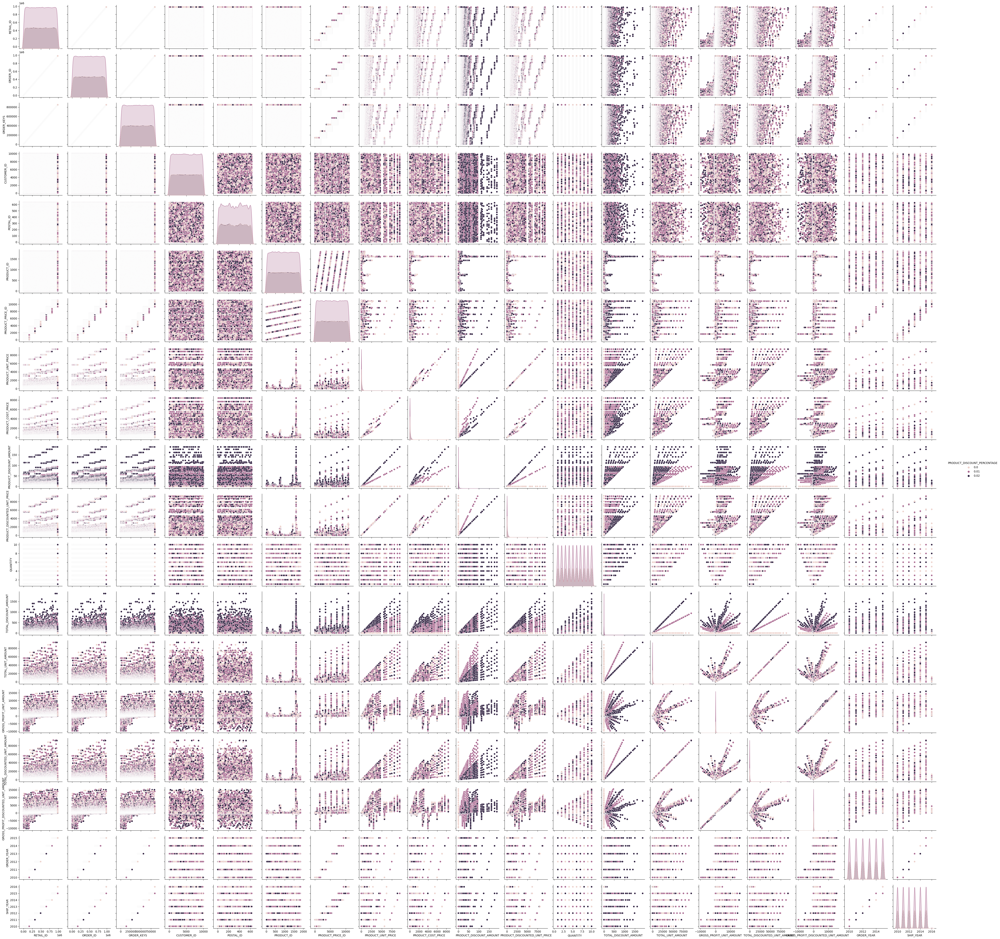

In [23]:
# g = sns.PairGrid(df)
# g.map_diag(plt.hist)
# g.map_upper(plt.scatter)
# g.map_lower(plt.scatter)

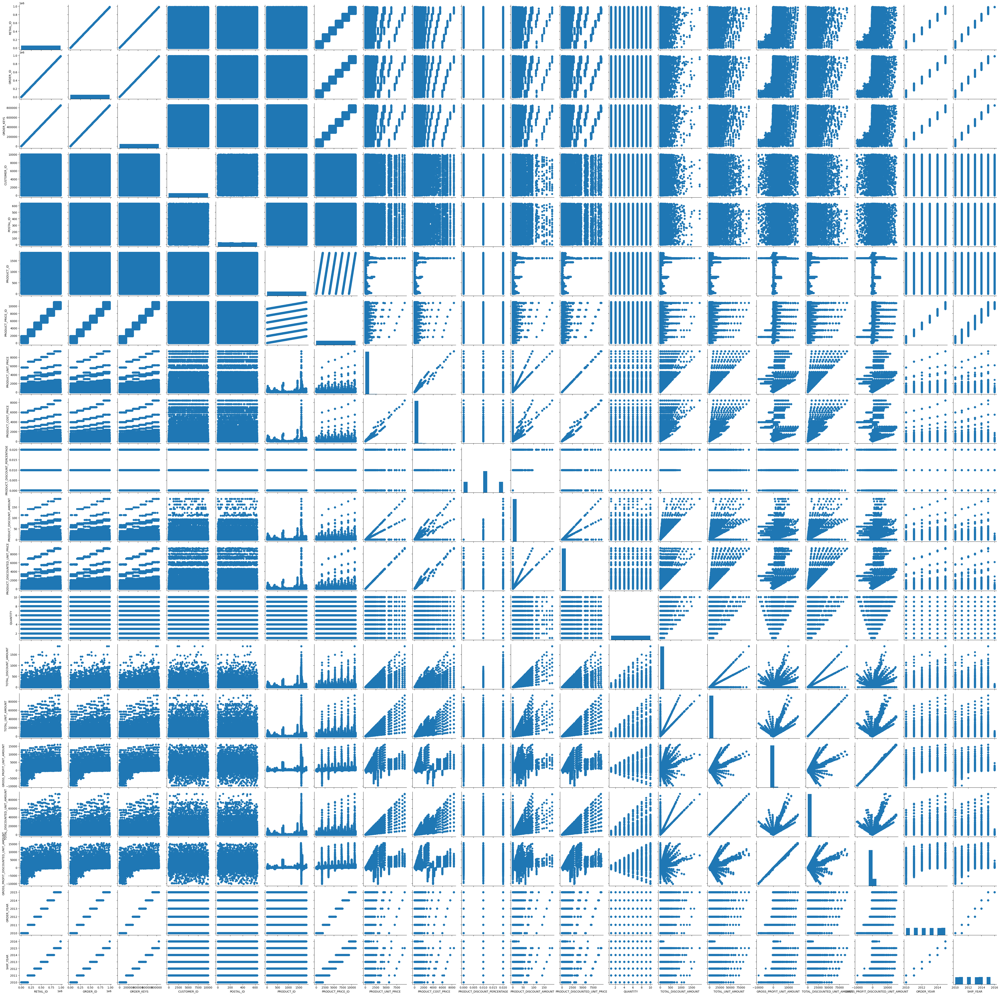

<Axes: >

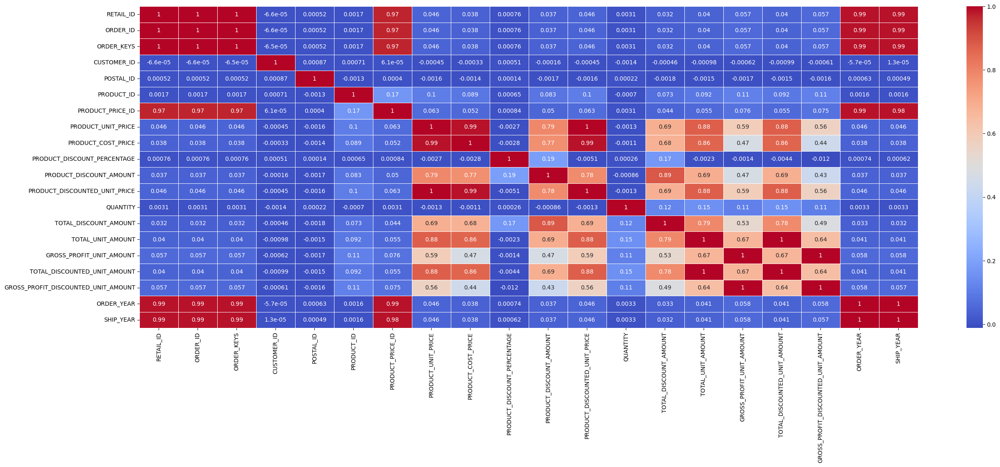

In [24]:
fig, ax = plt.subplots(figsize=(30,10))
sns.heatmap(df.corr(numeric_only=True),cmap='coolwarm',annot=True,linewidths=.5, ax=ax)

# Old Specific Questions

In [25]:
df.columns

Index(['RETAIL_ID', 'ORDER_ID', 'ORDER_KEYS', 'ORDER_DATE', 'SHIP_MODE',
       'SHIP_DATE', 'CUSTOMER_ID', 'FIRST_NAME', 'LAST_NAME', 'FULL_NAME',
       'POSTAL_ID', 'POSTAL_CODE', 'CITY', 'STATE', 'REGION', 'COUNTRY',
       'PRODUCT_ID', 'CATEGORY', 'SUB_CATEGORY', 'PRODUCT_NAME',
       'PRODUCT_PRICE_ID', 'PRODUCT_UNIT_PRICE', 'PRODUCT_COST_PRICE',
       'PRODUCT_DISCOUNT_PERCENTAGE', 'PRODUCT_DISCOUNT_AMOUNT',
       'PRODUCT_DISCOUNTED_UNIT_PRICE', 'QUANTITY', 'TOTAL_DISCOUNT_AMOUNT',
       'TOTAL_UNIT_AMOUNT', 'GROSS_PROFIT_UNIT_AMOUNT',
       'TOTAL_DISCOUNTED_UNIT_AMOUNT', 'GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT',
       'ORDER_MONTH_NAME', 'ORDER_YEAR', 'SHIP_MONTH_NAME', 'SHIP_YEAR'],
      dtype='object')

## What is the Average Profit for Products?

In [26]:
result = df.groupby('PRODUCT_NAME')['GROSS_PROFIT_UNIT_AMOUNT'].mean().sort_values(ascending=False)

Output_full_display(result)

PRODUCT_NAME
Canon imageCLASS 2200 Advanced Copier                                       8,117.51
Canon imageCLASS MF7460 Monochrome Digital Laser Multifunction Copier       5,910.35
Cisco TelePresence System EX90 Videoconferencing Unit                       3,642.69
Zebra ZM400 Thermal Label Printer                                           3,622.49
3D Systems Cube Printer, 2nd Generation, Magenta                            2,470.31
                                                                              ...   
Brother MFC-9340CDW LED All-In-One Printer, Copier Scanner                   -177.91
Bush Westfield Collection Bookcases, Dark Cherry Finish, Fully Assembled     -265.47
Okidata B401 Printer                                                         -269.44
Zebra GK420t Direct Thermal/Thermal Transfer Printer                         -381.88
Cubify CubeX 3D Printer Double Head Print                                    -405.64
Name: GROSS_PROFIT_UNIT_AMOUNT, Length: 1850, dtype:

## What is the Total Profit for Products?

In [27]:
result = df.groupby('PRODUCT_NAME')['GROSS_PROFIT_UNIT_AMOUNT'].sum().sort_values(ascending=False)

Output_full_display(result)

PRODUCT_NAME
Canon imageCLASS 2200 Advanced Copier                                       3,953,225.58
Canon imageCLASS MF7460 Monochrome Digital Laser Multifunction Copier       2,901,980.54
Cisco TelePresence System EX90 Videoconferencing Unit                       2,072,691.77
Zebra ZM400 Thermal Label Printer                                           1,995,989.27
3D Systems Cube Printer, 2nd Generation, Magenta                            1,358,671.59
                                                                                ...     
Brother MFC-9340CDW LED All-In-One Printer, Copier Scanner                    -97,317.54
Okidata B401 Printer                                                         -137,953.11
Bush Westfield Collection Bookcases, Dark Cherry Finish, Fully Assembled     -149,992.32
Zebra GK420t Direct Thermal/Thermal Transfer Printer                         -202,014.90
Cubify CubeX 3D Printer Double Head Print                                    -223,911.35
Name: GR

## How many customers are there per city/state/region

### City

In [28]:
result_df = df.groupby('CITY')['CUSTOMER_ID'].nunique().reset_index()
result_df.columns = ['CITY', 'COUNT_OF_CUSTOMERS']

display(result_df)

,CITY,COUNT_OF_CUSTOMERS
0,Aberdeen,12
1,Abilene,19
2,Akron,16
3,Albuquerque,17
4,Alexandria,18
...,...,...
526,Woonsocket,18
527,Yonkers,23
528,York,16
529,Yucaipa,16


In [29]:
total_num_customers = df.groupby('CITY')['CUSTOMER_ID'].nunique().sum()

display(total_num_customers)

10000

### State

In [30]:
result_df = df.groupby('STATE')['CUSTOMER_ID'].nunique().reset_index()
result_df.columns = ['STATE', 'COUNT_OF_CUSTOMERS']

display(result_df)

,STATE,COUNT_OF_CUSTOMERS
0,Alabama,111
1,Arizona,213
2,Arkansas,156
3,California,1392
4,Colorado,245
5,Connecticut,146
6,Delaware,55
7,District of Columbia,11
8,Florida,610
9,Georgia,175


In [31]:
total_num_customers = df.groupby('STATE')['CUSTOMER_ID'].nunique().sum()

display(total_num_customers)

10000

### Region

In [32]:
result_df = df.groupby('REGION')['CUSTOMER_ID'].nunique().reset_index()
result_df.columns = ['REGION', 'COUNT_OF_CUSTOMERS']

display(result_df)

,REGION,COUNT_OF_CUSTOMERS
0,Central,3029
1,East,1945
2,South,2197
3,West,2829


In [33]:
total_num_customers = df.groupby('REGION')['CUSTOMER_ID'].nunique().sum()

display(total_num_customers)

10000

## Which Customers are from more than 1 city

In [34]:
# Group by 'Customer_ID' and count the number of unique cities
customer_city_counts = df.groupby('CUSTOMER_ID')['CITY'].nunique()

# Filter for customers associated with more than one city
customers_in_multiple_cities = customer_city_counts[customer_city_counts > 1]

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'CUSTOMER_ID': customers_in_multiple_cities.index,
    'Num_of_Cities': customers_in_multiple_cities.values
})

display_all(result_df.head(10)) # Remove .head() if you want to see all the records or change the head value.

,CUSTOMER_ID,Num_of_Cities


In [35]:
# Check to see if the above code is True
# random_customer = df[df['CUSTOMER_ID'] == ''].sort_values(by='ORDER_DATE')
# display_all(random_customer.reset_index(drop=True))

## Which Customers are from more than 1 state

In [36]:
# Group by 'Customer_ID' and count the number of unique cities
customer_state_counts = df.groupby('CUSTOMER_ID')['STATE'].nunique()

# Filter for customers associated with more than one city
customers_in_multiple_states = customer_state_counts[customer_state_counts > 1]

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'CUSTOMER_ID': customers_in_multiple_states.index,
    'Num_of_Cities': customers_in_multiple_states.values
})

display_all(result_df.head(10)) # Remove .head() if you want to see all the records or change the head value.

,CUSTOMER_ID,Num_of_Cities


## Ranking of ship modes by volume/Profit

In [37]:
ship_mode_counts = df['SHIP_MODE'].value_counts().reset_index()
ship_mode_counts.columns = ['SHIP_MODE', 'SHIP_VOLUME']

ship_profit = df.groupby('SHIP_MODE')['GROSS_PROFIT_UNIT_AMOUNT'].sum().reset_index()

# Merging the count and profit DataFrames
df_ship_ranking = pd.merge(ship_mode_counts, ship_profit, on='SHIP_MODE', how='inner')

# Adding rankings
df_ship_ranking['SHIP_VOLUME_RANKING'] = df_ship_ranking['SHIP_VOLUME'].rank(ascending=False).apply(lambda x: '{:.0f}'.format(x))
df_ship_ranking['SHIP_PROFIT_RANKING'] = df_ship_ranking['GROSS_PROFIT_UNIT_AMOUNT'].rank(ascending=False).apply(lambda x: '{:.0f}'.format(x))

# Formatting profit to two decimal places
df_ship_ranking['GROSS_PROFIT_UNIT_AMOUNT'] = df_ship_ranking['GROSS_PROFIT_UNIT_AMOUNT'].apply(lambda x: '{:.2f}'.format(x))

display_all(df_ship_ranking.head())

,SHIP_MODE,SHIP_VOLUME,GROSS_PROFIT_UNIT_AMOUNT,SHIP_VOLUME_RANKING,SHIP_PROFIT_RANKING
0,First Class,328921,27362309.50,1,2
1,Second Class,327506,27391894.17,2,1
2,Standard Class,327465,27353063.32,3,3


## How many are discounted compared to non-discounted

- 0 means the order is not discounted
- 1 means the order is discounted

In [38]:
# Create 'is_discounted' column based on conditions
df['IS_DISCOUNTED'] = df['PRODUCT_DISCOUNT_PERCENTAGE'].apply(lambda x: 0 if x == 0.00 else 1)

display_all(df.head(10)) # Remove .head() if you want to see all the records or change the head value.

,RETAIL_ID,ORDER_ID,ORDER_KEYS,ORDER_DATE,SHIP_MODE,SHIP_DATE,CUSTOMER_ID,FIRST_NAME,LAST_NAME,FULL_NAME,POSTAL_ID,POSTAL_CODE,CITY,STATE,REGION,COUNTRY,PRODUCT_ID,CATEGORY,SUB_CATEGORY,PRODUCT_NAME,PRODUCT_PRICE_ID,PRODUCT_UNIT_PRICE,PRODUCT_COST_PRICE,PRODUCT_DISCOUNT_PERCENTAGE,PRODUCT_DISCOUNT_AMOUNT,PRODUCT_DISCOUNTED_UNIT_PRICE,QUANTITY,TOTAL_DISCOUNT_AMOUNT,TOTAL_UNIT_AMOUNT,GROSS_PROFIT_UNIT_AMOUNT,TOTAL_DISCOUNTED_UNIT_AMOUNT,GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT,ORDER_MONTH_NAME,ORDER_YEAR,SHIP_MONTH_NAME,SHIP_YEAR,IS_DISCOUNTED
0,1,1,1,2010-01-01,Standard Class,2010-01-08,9310,Freddie,Elliott,Freddie Elliott,70,14304,Niagara Falls,New York,East,United States,887,Office Supplies,Envelopes,Wausau Papers Astrobrights Colored Envelopes,887,5.90,3.37,0.02,0.1180,5.7820,8,0.9440,47.20,20.24,46.2560,19.2960,January,2010,January,2010,1
1,2,2,2,2010-01-01,Second Class,2010-01-04,108,Brian,DeCherney,Brian DeCherney,556,92592,Temecula,California,West,United States,582,Office Supplies,Art,Newell 336,582,4.20,3.38,0.02,0.0840,4.1160,7,0.5880,29.40,5.74,28.8120,5.1520,January,2010,January,2010,1
2,3,3,3,2010-01-01,First Class,2010-01-02,8690,William,Owen,William Owen,573,93534,Lancaster,California,West,United States,543,Office Supplies,Art,Hunt BOSTON Model 1606 High-Volume Electric Pe...,543,166.95,153.04,0.00,0.0000,166.9500,6,0.0000,1001.70,83.46,1001.7000,83.4600,January,2010,January,2010,0
3,4,4,4,2010-01-01,First Class,2010-01-02,2278,Grant,Spencer,Grant Spencer,42,7109,Belleville,New Jersey,East,United States,1821,Technology,Phones,Samsung Galaxy S4 Active,1821,499.99,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018,January,2010,January,2010,1
4,5,5,5,2010-01-01,First Class,2010-01-02,9006,Bryson,Jackson,Bryson Jackson,419,76106,Fort Worth,Texas,Central,United States,1821,Technology,Phones,Samsung Galaxy S4 Active,1821,499.99,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018,January,2010,January,2010,1
5,6,6,6,2010-01-01,Standard Class,2010-01-08,7514,Maddox,Simpson,Maddox Simpson,364,64118,Gladstone,Missouri,Central,United States,1821,Technology,Phones,Samsung Galaxy S4 Active,1821,499.99,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018,January,2010,January,2010,1
6,7,7,7,2010-01-01,Standard Class,2010-01-08,5989,Nicholas,Thomson,Nicholas Thomson,80,19134,Philadelphia,Pennsylvania,East,United States,670,Office Supplies,Binders,"Avery Durable Slant Ring Binders, No Labels",670,3.01,2.60,0.01,0.0301,2.9799,3,0.0903,9.03,1.23,8.9397,1.1397,January,2010,January,2010,1
7,8,8,8,2010-01-01,First Class,2010-01-02,3151,Kevin,Morrison,Kevin Morrison,350,61032,Freeport,Illinois,Central,United States,82,Furniture,Chairs,"Global Stack Chair with Arms, Black",82,28.87,25.06,0.00,0.0000,28.8700,8,0.0000,230.96,30.48,230.9600,30.4800,January,2010,January,2010,0
8,9,9,9,2010-01-01,Second Class,2010-01-04,1697,Bentley,Williams,Bentley Williams,52,10009,New York City,New York,East,United States,82,Furniture,Chairs,"Global Stack Chair with Arms, Black",82,28.87,25.06,0.00,0.0000,28.8700,8,0.0000,230.96,30.48,230.9600,30.4800,January,2010,January,2010,0
9,10,10,10,2010-01-01,First Class,2010-01-02,3151,Kevin,Morrison,Kevin Morrison,350,61032,Freeport,Illinois,Central,United States,1054,Office Supplies,Paper,Southworth 100% Cotton The Best Paper,1054,11.33,6.35,0.02,0.2266,11.1034,7,1.5862,79.31,34.86,77.7238,33.2738,January,2010,January,2010,1


In [39]:
# Answer to the question
counts = df['IS_DISCOUNTED'].value_counts()

display(counts)

IS_DISCOUNTED
1    737445
0    246447
Name: count, dtype: int64

In [40]:
# The Profit comparison of Discount vs Non-Discounted
result = df.groupby('IS_DISCOUNTED')['GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT'].sum()

Output_full_display(result)

IS_DISCOUNTED
0    20,954,194.71
1    55,672,096.13
Name: GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT, dtype: object

In [41]:
# Custom labels for the pie chart
labels = ['1: Discounted', '0: Non-discounted']

Text(0.5, 1.0, 'Discounted vs. Non-discounted Products')

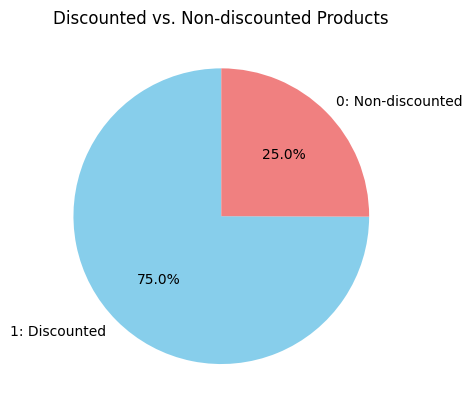

In [42]:
# Create a pie chart using Matplotlib
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Discounted vs. Non-discounted Products')


Text(0.5, 1.0, 'Discounted vs. Non-discounted Products')

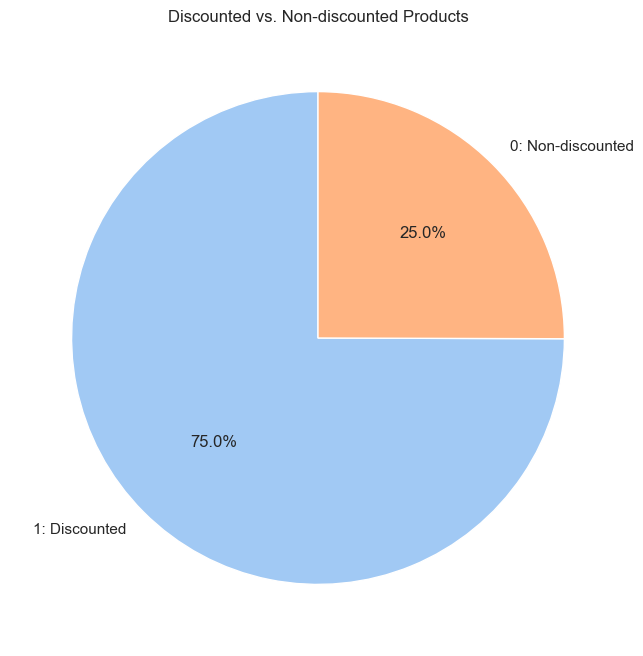

In [43]:
# Create a pie chart using Seaborn
plt.figure(figsize=(8, 8))
sns.set(style="whitegrid")
sns.color_palette("pastel")
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))

# Title for the pie chart
plt.title('Discounted vs. Non-discounted Products')

## Ranking for products in Volume/Profit

In [44]:
product_count = df['PRODUCT_NAME'].value_counts().reset_index()
product_count.columns = ['PRODUCT_NAME', 'PRODUCT_VOLUME']

product_profit = df.groupby('PRODUCT_NAME')['GROSS_PROFIT_UNIT_AMOUNT'].sum().reset_index()

# Merging the count and profit DataFrames
df_product_ranking = pd.merge(product_count, product_profit, on='PRODUCT_NAME', how='inner')

# Sorting by volume and profit in descending order
df_product_ranking = df_product_ranking.sort_values(by=['PRODUCT_VOLUME', 'GROSS_PROFIT_UNIT_AMOUNT'], ascending=[False, False])

# Adding rankings
df_product_ranking['VOLUME_RANKING'] = df_product_ranking['PRODUCT_VOLUME'].rank(ascending=False, method='dense').apply(lambda x: '{:.0f}'.format(x))
df_product_ranking['PROFIT_RANKING'] = df_product_ranking['GROSS_PROFIT_UNIT_AMOUNT'].rank(ascending=False, method='dense').apply(lambda x: '{:.0f}'.format(x))

# Formatting profit to two decimal places
df_product_ranking['GROSS_PROFIT_UNIT_AMOUNT'] = df_product_ranking['GROSS_PROFIT_UNIT_AMOUNT'].apply(lambda x: '{:.2f}'.format(x))

display_all(df_product_ranking.head(10)) # Remove .head() if you want to see all the records or change the head value.

,PRODUCT_NAME,PRODUCT_VOLUME,GROSS_PROFIT_UNIT_AMOUNT,VOLUME_RANKING,PROFIT_RANKING
0,"TOPS Carbonless Receipt Book, Four 2-3/4 x 7-1...",640,30896.36,1,508
1,Bevis Rectangular Conference Tables,635,-23237.00,2,1835
2,"Plantronics CS 50-USB - headset - Convertible,...",630,74288.97,3,237
3,KI Adjustable-Height Table,625,32163.85,4,496
4,Eldon Mobile Mega Data Cart Mega Stackable A...,625,27167.97,4,558
6,Penpower WorldCard Pro Card Scanner,624,44511.41,5,387
5,Wilson Jones Active Use Binders,624,4991.37,5,1387
8,Global Chrome Stack Chair,622,8254.28,6,1126
7,"Black Avery Memo-Size 3-Ring Binder, 5 1/2"" x ...",622,2573.10,6,1600
9,Tops Green Bar Computer Printout Paper,621,101084.71,7,164


In [45]:
# Check to see if the above code is True
random_product = df[df['PRODUCT_NAME'] == 'Staple-based wall hangings'].sort_values(by='ORDER_DATE')

display_all(random_product.reset_index(drop=True).head())

,RETAIL_ID,ORDER_ID,ORDER_KEYS,ORDER_DATE,SHIP_MODE,SHIP_DATE,CUSTOMER_ID,FIRST_NAME,LAST_NAME,FULL_NAME,POSTAL_ID,POSTAL_CODE,CITY,STATE,REGION,COUNTRY,PRODUCT_ID,CATEGORY,SUB_CATEGORY,PRODUCT_NAME,PRODUCT_PRICE_ID,PRODUCT_UNIT_PRICE,PRODUCT_COST_PRICE,PRODUCT_DISCOUNT_PERCENTAGE,PRODUCT_DISCOUNT_AMOUNT,PRODUCT_DISCOUNTED_UNIT_PRICE,QUANTITY,TOTAL_DISCOUNT_AMOUNT,TOTAL_UNIT_AMOUNT,GROSS_PROFIT_UNIT_AMOUNT,TOTAL_DISCOUNTED_UNIT_AMOUNT,GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT,ORDER_MONTH_NAME,ORDER_YEAR,SHIP_MONTH_NAME,SHIP_YEAR,IS_DISCOUNTED
0,3548,3548,3037,2010-01-08,Standard Class,2010-01-15,1201,Rhett,Hamilton,Rhett Hamilton,80,19134,Philadelphia,Pennsylvania,East,United States,300,Furniture,Furnishings,Staple-based wall hangings,300,7.6,5.81,0.01,0.076,7.524,2,0.152,15.2,3.58,15.048,3.428,January,2010,January,2010,1
1,3549,3549,3038,2010-01-08,Standard Class,2010-01-15,7002,Samuel,Edwards,Samuel Edwards,91,20877,Gaithersburg,Maryland,East,United States,300,Furniture,Furnishings,Staple-based wall hangings,300,7.6,5.81,0.01,0.076,7.524,2,0.152,15.2,3.58,15.048,3.428,January,2010,January,2010,1
2,5602,5602,4827,2010-01-13,Second Class,2010-01-16,7434,Thomas,Robertson,Thomas Robertson,426,77070,Houston,Texas,Central,United States,300,Furniture,Furnishings,Staple-based wall hangings,300,7.6,5.81,0.00,0.000,7.600,5,0.000,38.0,8.95,38.000,8.950,January,2010,January,2010,0
3,7809,7809,6736,2010-01-18,Second Class,2010-01-21,381,Joe,Kamberova,Joe Kamberova,337,60302,Oak Park,Illinois,Central,United States,300,Furniture,Furnishings,Staple-based wall hangings,300,7.6,5.81,0.01,0.076,7.524,8,0.608,60.8,14.32,60.192,13.712,January,2010,January,2010,1
4,9030,9030,7814,2010-01-21,Second Class,2010-01-24,2355,Christopher,Grant,Christopher Grant,76,18018,Bethlehem,Pennsylvania,East,United States,300,Furniture,Furnishings,Staple-based wall hangings,300,7.6,5.81,0.01,0.076,7.524,1,0.076,7.6,1.79,7.524,1.714,January,2010,January,2010,1


## Which months/years has the most sales in volume/profit

In [46]:
# Which months are the customers most active
df['ORDER_MONTH_NAME'].value_counts()

ORDER_MONTH_NAME
March        83892
August       83875
May          83853
December     83698
October      83365
January      83222
July         82966
September    81645
November     81189
April        80434
June         80063
February     75690
Name: count, dtype: int64

In [47]:
# Which months made the most profit
Output_full_display(df.groupby('ORDER_MONTH_NAME')['GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT'].sum())

ORDER_MONTH_NAME
April        6,219,557.28
August       6,324,233.12
December     6,640,106.83
February     6,030,244.88
January      6,827,187.53
July         6,402,568.22
June         6,150,390.19
March        6,395,189.27
May          6,488,888.79
November     6,156,314.95
October      6,668,110.75
September    6,323,499.03
Name: GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT, dtype: object

In [48]:
# How many orders were made each year
df['ORDER_YEAR'].value_counts().sort_values(ascending=True)

ORDER_YEAR
2013    163460
2012    163646
2014    163746
2010    163826
2015    164405
2011    164809
Name: count, dtype: int64

In [49]:
# Which years made the most profit
Output_full_display(df.groupby('ORDER_YEAR')['GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT'].sum())

ORDER_YEAR
2010     6,219,019.25
2011    10,493,706.22
2012    12,615,964.38
2013    14,355,989.47
2014    15,795,142.67
2015    17,146,468.86
Name: GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT, dtype: object

In [50]:
df[['ORDER_YEAR', 'ORDER_MONTH_NAME']].value_counts().sort_values(ascending=True)

ORDER_YEAR  ORDER_MONTH_NAME
2014        February            12398
2010        February            12454
2011        February            12532
2013        February            12568
2015        February            12715
                                ...  
2012        August              14218
2010        May                 14222
2011        May                 14254
2013        August              14351
2011        July                14388
Name: count, Length: 72, dtype: int64

In [51]:
df[['ORDER_YEAR', 'ORDER_MONTH_NAME']].value_counts().sort_index(ascending=True)

ORDER_YEAR  ORDER_MONTH_NAME
2010        April               13707
            August              13792
            December            13738
            February            12454
            January             13701
                                ...  
2015        March               13847
            May                 13925
            November            13538
            October             13884
            September           13777
Name: count, Length: 72, dtype: int64

## Products sold per Month for each Year

In [52]:
# Products sold per Month for each Year
result = df[['ORDER_YEAR', 'ORDER_MONTH_NAME', 'PRODUCT_NAME']].value_counts().sort_index(ascending=True)

display_all(result)

ORDER_YEAR  ORDER_MONTH_NAME  PRODUCT_NAME                                                                                       
2010        April             "While you Were Out" Message Book, One Form per Page                                                    4
                              #10 Gummed Flap White Envelopes, 100/Box                                                                5
                              #10 Self-Seal White Envelopes                                                                           4
                              #10 White Business Envelopes,4 1/8 x 9 1/2                                                             10
                              #10- 4 1/8" x 9 1/2" Recycled Envelopes                                                                 8
                                                                                                                                     ..
2015        September         iKross Bluetooth Portabl

In [53]:
# How many of those are unique
result = df.groupby(['ORDER_YEAR', 'ORDER_MONTH_NAME'])['PRODUCT_NAME'].nunique().sort_index(ascending=True)

display_all(result)

ORDER_YEAR  ORDER_MONTH_NAME
2010        April               1825
            August              1836
            December            1829
            February            1823
            January             1838
            July                1834
            June                1825
            March               1837
            May                 1838
            November            1834
            October             1833
            September           1829
2011        April               1835
            August              1839
            December            1830
            February            1831
            January             1835
            July                1840
            June                1827
            March               1837
            May                 1831
            November            1829
            October             1835
            September           1828
2012        April               1827
            August              1840
         

In [54]:
# Shows how many of the unique products was sold each year
result = df.groupby(['ORDER_YEAR'])['PRODUCT_NAME'].nunique().sort_index(ascending=True)

display_all(result)

ORDER_YEAR
2010    1850
2011    1850
2012    1850
2013    1850
2014    1850
2015    1850
Name: PRODUCT_NAME, dtype: int64

In [55]:
# Grouping by 'Order_Year' and 'Product_Name', counting unique months
product_month_counts = df.groupby(['ORDER_YEAR', 'PRODUCT_NAME', 'ORDER_MONTH_NAME']).size().reset_index(name='Count')

# Filtering products that appear in multiple months within the same year
multiple_months = product_month_counts.groupby(['ORDER_YEAR', 'PRODUCT_NAME'])['Count'].count().reset_index(name='MonthsCount')

# Filtering products that show up in more than one month within the same year
Frequent_Products_sold = multiple_months[multiple_months['MonthsCount'] > 1]

# Displaying the products that show up in multiple months within the same year
display_all(Frequent_Products_sold.head(25))

,ORDER_YEAR,PRODUCT_NAME,MonthsCount
0,2010,"""While you Were Out"" Message Book, One Form pe...",12
1,2010,"#10 Gummed Flap White Envelopes, 100/Box",12
2,2010,#10 Self-Seal White Envelopes,12
3,2010,"#10 White Business Envelopes,4 1/8 x 9 1/2",12
4,2010,"#10- 4 1/8"" x 9 1/2"" Recycled Envelopes",12
5,2010,"#10- 4 1/8"" x 9 1/2"" Security-Tint Envelopes",12
6,2010,"#10-4 1/8"" x 9 1/2"" Premium Diagonal Seam Enve...",12
7,2010,#6 3/4 Gummed Flap White Envelopes,12
8,2010,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",12
9,2010,1/4 Fold Party Design Invitations & White Enve...,12


In [56]:
# How many products are sold in more than 1 month
Frequent_Products_sold['ORDER_YEAR'].value_counts().sort_values(ascending=True)

ORDER_YEAR
2010    1850
2011    1850
2012    1850
2013    1850
2014    1850
2015    1850
Name: count, dtype: int64

# New Specific Questions

Which products were not sold for multiple Months/Years (done separately)
- From the information I found this question is not possible as all products were sold for each month and year.

# Quick Conclusion about the Dataset

Exploring through the Superstore 2015 dataset:
- There are a total of 983,892 records of orders with 32 columns. Where there many columns with close - very close correlation to each other.
- There are no nulls were found in the dataset.
- In this dataset the unique customers' orders only from 1 city instead from multiple cities like the previous dataset.
- Surprisingly when I generated the dataset the number of discounted products to non-discounted products came out to be 75% to 25% respectively
- Seems that they sold most products in 2011, however made most profit in 2015.
    - Possible cause could be due to inflation?

# What To Do Next

- Is to create and design dashboards using the dataset with Tableau and for Dash.

# Tableau

Story: Which cities are worth adding a warehouse and with which products?
- A map to see the locations (Are the cities close together or spread out)
- Sub-category in descending order for each city depending on the orders volume/gross profit?

The Tableau Public URL Link:
- https://public.tableau.com/app/profile/ivan.philaretou/viz/Superstore_Datamart_2015_Final_Story/FinalStory?publish=yes

What I have Observed from the Dataset:
- From the map, California is the most dominate state, followed by Texas.
    - What I noticed is that the states which did really well in both volume and profit:
        - Has alot more cities within their states. 
        - Are close to a water source.
        - There are atleast 1 cluster of cities.
- Los Angeles seems to be an outlier among the cities, followed by Houston.

- When it came to the volume of the products by sub category paper dominated the charts and with copiers being the lowest consistently. 
    - However, when it came to the profit of the products by sub category the majority of the top spot rotated between machines,copiers and phones. With machines being more often on the top. Fasteners being the at the bottom most of the time.
    - Also there are some cities with negative profit values, which was suprisely machines for some of them.

Improvements I could have done or added:
- I could have had a pie chart or text indicating the number of cities filtered by the state.
    - Also, I could have had a percentage of the profit and volume per state/city/sub-category to help indicate the distribution of gross profit and volume easier.
        - This would be done on a separate dashboard though to complement the current dashboard.
- I could have made a visual on the gross profit margin.
- The map needs to have better constrast in colour with the land and water.
- Might add the another dashboard with the improvements included:
    - ??
    - ??

# Dash

Story: Show the time distrubution for anything?
- Months per year (with filters)

I have decided to make another Jupyter Notebook for Dash and Python File as it will easier to follow as well as not to make this one too long.

- Jupyter Notebook: **Build_Dash_My_Superstore_2015_Timeline.ipynb**
- Python File Name: **Final_Dash_My_Superstore_2015_Timeline.py**
- Final Python File Name: **Final_Dash_My_Superstore_2015_Timeline_Optimised.py**

The reason I have Jupyter Notebook / Python File, because with the Jupyter Notebook I can use the **modular approach** more easily (benefits: to testing and to make any quick fixes) and then assemble the final complete Dash in a Python File.

I have decide to add another column called BRAND_NAME. 

However, as I was assigning my brand names via Microsoft Excel as I see fit to the products to group them together. **I do regret, that I did not do this before the Oracle Superstore Setup.**

I learned that I should have been more thorough on the lowest granular level, when I was cleaning my data. A Hindsight, I will remember and avoid in the future. 

# Export the Modified Data for Tableau and Dash

In [57]:
df.columns

Index(['RETAIL_ID', 'ORDER_ID', 'ORDER_KEYS', 'ORDER_DATE', 'SHIP_MODE',
       'SHIP_DATE', 'CUSTOMER_ID', 'FIRST_NAME', 'LAST_NAME', 'FULL_NAME',
       'POSTAL_ID', 'POSTAL_CODE', 'CITY', 'STATE', 'REGION', 'COUNTRY',
       'PRODUCT_ID', 'CATEGORY', 'SUB_CATEGORY', 'PRODUCT_NAME',
       'PRODUCT_PRICE_ID', 'PRODUCT_UNIT_PRICE', 'PRODUCT_COST_PRICE',
       'PRODUCT_DISCOUNT_PERCENTAGE', 'PRODUCT_DISCOUNT_AMOUNT',
       'PRODUCT_DISCOUNTED_UNIT_PRICE', 'QUANTITY', 'TOTAL_DISCOUNT_AMOUNT',
       'TOTAL_UNIT_AMOUNT', 'GROSS_PROFIT_UNIT_AMOUNT',
       'TOTAL_DISCOUNTED_UNIT_AMOUNT', 'GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT',
       'ORDER_MONTH_NAME', 'ORDER_YEAR', 'SHIP_MONTH_NAME', 'SHIP_YEAR',
       'IS_DISCOUNTED'],
      dtype='object')

In [58]:
# This is just the Order of Columns I prefer.
df_sorted = df[['RETAIL_ID', 'ORDER_ID', 'ORDER_KEYS', 'ORDER_DATE',
        'ORDER_MONTH_NAME', 'ORDER_YEAR', 'SHIP_MODE',
        'SHIP_DATE','SHIP_MONTH_NAME', 'SHIP_YEAR', 'CUSTOMER_ID',
        'FIRST_NAME', 'LAST_NAME', 'FULL_NAME',
        'POSTAL_ID', 'POSTAL_CODE', 'CITY', 'STATE', 'REGION', 'COUNTRY',
        'PRODUCT_ID', 'CATEGORY', 'SUB_CATEGORY', 'PRODUCT_NAME',
        'PRODUCT_PRICE_ID', 'PRODUCT_UNIT_PRICE', 'PRODUCT_COST_PRICE',
        'PRODUCT_DISCOUNT_PERCENTAGE', 'PRODUCT_DISCOUNT_AMOUNT',
        'PRODUCT_DISCOUNTED_UNIT_PRICE', 'QUANTITY', 'TOTAL_DISCOUNT_AMOUNT',
        'TOTAL_UNIT_AMOUNT', 'GROSS_PROFIT_UNIT_AMOUNT',
        'TOTAL_DISCOUNTED_UNIT_AMOUNT', 'GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT',
        'IS_DISCOUNTED']]

In [59]:
display_all(df_sorted.head())

,RETAIL_ID,ORDER_ID,ORDER_KEYS,ORDER_DATE,ORDER_MONTH_NAME,ORDER_YEAR,SHIP_MODE,SHIP_DATE,SHIP_MONTH_NAME,SHIP_YEAR,CUSTOMER_ID,FIRST_NAME,LAST_NAME,FULL_NAME,POSTAL_ID,POSTAL_CODE,CITY,STATE,REGION,COUNTRY,PRODUCT_ID,CATEGORY,SUB_CATEGORY,PRODUCT_NAME,PRODUCT_PRICE_ID,PRODUCT_UNIT_PRICE,PRODUCT_COST_PRICE,PRODUCT_DISCOUNT_PERCENTAGE,PRODUCT_DISCOUNT_AMOUNT,PRODUCT_DISCOUNTED_UNIT_PRICE,QUANTITY,TOTAL_DISCOUNT_AMOUNT,TOTAL_UNIT_AMOUNT,GROSS_PROFIT_UNIT_AMOUNT,TOTAL_DISCOUNTED_UNIT_AMOUNT,GROSS_PROFIT_DISCOUNTED_UNIT_AMOUNT,IS_DISCOUNTED
0,1,1,1,2010-01-01,January,2010,Standard Class,2010-01-08,January,2010,9310,Freddie,Elliott,Freddie Elliott,70,14304,Niagara Falls,New York,East,United States,887,Office Supplies,Envelopes,Wausau Papers Astrobrights Colored Envelopes,887,5.90,3.37,0.02,0.1180,5.7820,8,0.9440,47.20,20.24,46.2560,19.2960,1
1,2,2,2,2010-01-01,January,2010,Second Class,2010-01-04,January,2010,108,Brian,DeCherney,Brian DeCherney,556,92592,Temecula,California,West,United States,582,Office Supplies,Art,Newell 336,582,4.20,3.38,0.02,0.0840,4.1160,7,0.5880,29.40,5.74,28.8120,5.1520,1
2,3,3,3,2010-01-01,January,2010,First Class,2010-01-02,January,2010,8690,William,Owen,William Owen,573,93534,Lancaster,California,West,United States,543,Office Supplies,Art,Hunt BOSTON Model 1606 High-Volume Electric Pe...,543,166.95,153.04,0.00,0.0000,166.9500,6,0.0000,1001.70,83.46,1001.7000,83.4600,0
3,4,4,4,2010-01-01,January,2010,First Class,2010-01-02,January,2010,2278,Grant,Spencer,Grant Spencer,42,7109,Belleville,New Jersey,East,United States,1821,Technology,Phones,Samsung Galaxy S4 Active,1821,499.99,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018,1
4,5,5,5,2010-01-01,January,2010,First Class,2010-01-02,January,2010,9006,Bryson,Jackson,Bryson Jackson,419,76106,Fort Worth,Texas,Central,United States,1821,Technology,Phones,Samsung Galaxy S4 Active,1821,499.99,369.99,0.02,9.9998,489.9902,9,89.9982,4499.91,1170.00,4409.9118,1080.0018,1


In [60]:
# df_sorted.to_csv('Superstore_Datamart_2015_Modified.csv', encoding='utf-8',  index=False)